# 02. Training and Improving Neural Networks

The last lecture we will work with tabulated structured data. NN don't work well on them.

We will review the concepts we learned in the ML course because they largely are used in DL as well:
- Regularization
- Bias and variance
   - Error analysis 
- Optimization algorithms
- Hyperparameter tuning
- Normalization

### Looking at the quizes from the ML Course

1. A model converges if it has Gradient Descent
2. There is no boosing in RF
3. LOESS - [local regression](https://en.wikipedia.org/wiki/Local_regression)
4. Sentiment analysis - the process of analyzing digital text to determine if the emotional tone of the message is positive, negative, or neutral
5. Fine tuning - it is called TL - Transfer learning in DL.
   - We freeze the gradients so it stops training
   - We add additional layers
     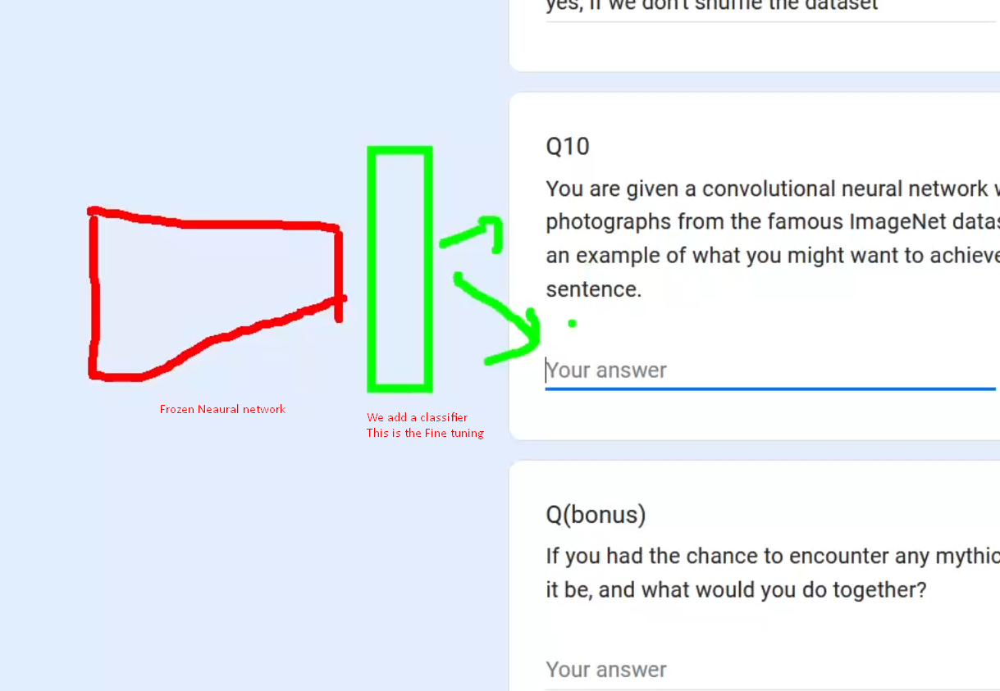
6.  Early stopping - a form of regularization that stops the training process of a neural network before it reaches the maximum number of epochs or iterations. The idea is to monitor the performance of the network on a validation set, and stop the training when the validation error starts to increase or stops improving.
7.  [Label propagation](https://en.wikipedia.org/wiki/Label_propagation_algorithm#:~:text=Label%20propagation%20is%20a%20semi,have%20labels%20(or%20classifications).) - we use the labeled data to train a model and predict a small group of unlabeled and then we add the predicted data to the training set and we propagate like this ... So we get kind of a "informed decision/prediction" data that we can trust more than just randomly setting the unlabeled data.
8.  PCA and Regularization are meant to make the model weaker. To add bias.
9.  Oversampling rarely works well in the real world. The model overfits synthethic data more easily.

Take note to how you split train val test datasets from the data. Cross validation is used when we don't have that much data to begin with, so we dont have to do it
if we have lets say 1 000 000 data points. We can separate 10k for validation and 10k for testing. That is enough. The Law of large numbers says that is enough. The sample mean will be converging enough to the population mean with n = 10k in this case. This way we have 980k data points to train the model. This will result in a better model. The size of the test split can be thought of (imo) as a how sure do you want to be that the model is usable in real life kind of way. QA is very important in business.

Depending on the business case you need to split the data differently. If it is something life threateing as a prediction you need to make sure you are as sure as possible about your model's prediction.

Don't just use default separations like 80-20 or something like that. Actually THINK before you do something. You have to be able to answer why you did or presumed something ( in the case of a default parameter - which is a hypothesis in of it self ). Even the data split. So think! 


In NN we rearely tune the hyperparams. The architecture of the NN is the most important thing.

NN always overfit the data so we need to choose the test dataset carefully

[Jaccard index](https://www.statisticshowto.com/jaccard-index/) - used in images. Intersection/Union of 2 images

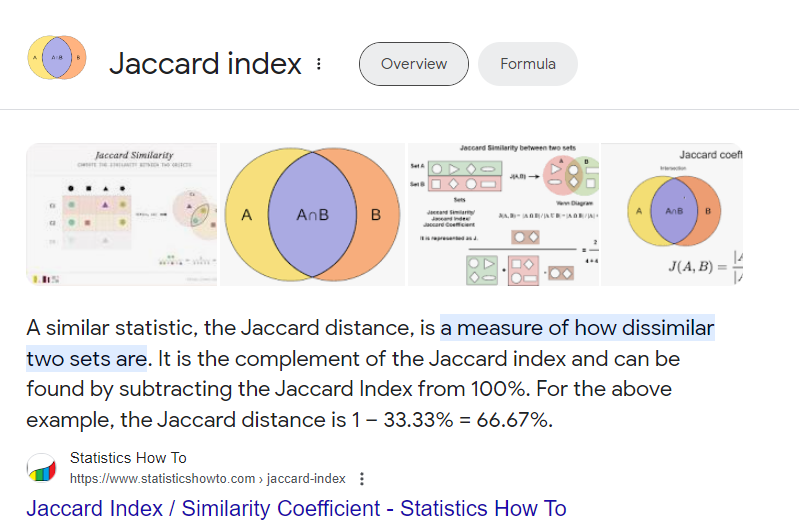

## New lecture material starts

In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 

import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout

In [4]:
housing_data = pd.read_csv("sample_data/california_housing_train.csv")

In [5]:
housing_data.describe().T

,count,mean,std,min,25%,50%,75%,max
longitude,17000.0,-119.562108,2.005166,-124.3500,-121.790000,-118.4900,-118.000,-114.3100
latitude,17000.0,35.625225,2.137340,32.5400,33.930000,34.2500,37.720,41.9500
housing_median_age,17000.0,28.589353,12.586937,1.0000,18.000000,29.0000,37.000,52.0000
total_rooms,17000.0,2643.664412,2179.947071,2.0000,1462.000000,2127.0000,3151.250,37937.0000
total_bedrooms,17000.0,539.410824,421.499452,1.0000,297.000000,434.0000,648.250,6445.0000
population,17000.0,1429.573941,1147.852959,3.0000,790.000000,1167.0000,1721.000,35682.0000
households,17000.0,501.221941,384.520841,1.0000,282.000000,409.0000,605.250,6082.0000
median_income,17000.0,3.883578,1.908157,0.4999,2.566375,3.5446,4.767,15.0001
median_house_value,17000.0,207300.912353,115983.764387,14999.0000,119400.000000,180400.0000,265000.000,500001.0000


In [6]:
housing_data.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value'],
      dtype='object')

In [7]:
housing_data.dtypes

longitude             float64
latitude              float64
housing_median_age    float64
total_rooms           float64
total_bedrooms        float64
population            float64
households            float64
median_income         float64
median_house_value    float64
dtype: object

If we have categorical types we can one-hot encode with padnas (get_dummies()) or with tensorflow like this:

In [11]:
tf.one_hot([1,2,3,8], depth=10)

<tf.Tensor: shape=(4, 10), dtype=float32, numpy=
array([[0., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.]], dtype=float32)>

We can do the same with text. Separate the text into tokens and then map them from a look-up table to numbers and then one-hot encode those numbers.

We can transform the data with tf as well. We just add such layers that do these transformations.

In [30]:
num_columns = attributes_train.shape[1]

# Target is 1 variable that is a number (regression)
num_outputs = 1

With classification it is still 1 variable but we have to specify the number of classes we have

In [31]:
attributes = housing_data.drop(columns = ["median_house_value"])
target = housing_data.median_house_value

In [32]:
0.25 * len(housing_data)

4250.0

In [102]:
attributes_train_val, attributes_test, target_train_val, target_test =  train_test_split(attributes, target, test_size = 5000)

In [103]:
attributes_train_val.shape, attributes_test.shape

((12000, 8), (5000, 8))

In [104]:
attributes_train_val.values

array([[-1.2230e+02,  3.7970e+01,  3.0000e+01, ...,  1.7770e+03,
         7.1800e+02,  3.6393e+00],
       [-1.2190e+02,  3.7670e+01,  7.0000e+00, ...,  3.9260e+03,
         1.2290e+03,  7.4353e+00],
       [-1.1887e+02,  3.4180e+01,  2.1000e+01, ...,  3.1880e+03,
         1.3080e+03,  3.4676e+00],
       ...,
       [-1.1708e+02,  3.2670e+01,  3.1000e+01, ...,  2.0880e+03,
         7.5700e+02,  2.5662e+00],
       [-1.1812e+02,  3.4180e+01,  4.7000e+01, ...,  1.5370e+03,
         4.8100e+02,  3.4777e+00],
       [-1.1840e+02,  3.3930e+01,  3.5000e+01, ...,  1.0000e+03,
         4.5000e+02,  4.7319e+00]])

Separate a dataset for validation from the train set. With only 17k data points we should use cross-validation but we wont do it atm.

In tensorflow there isn't a good way to do cross-validation

In [105]:
attributes_train, attributes_val, target_train, target_val =  train_test_split(attributes_train_val, target_train_val, test_size = 2000)

In [106]:
len(attributes_train), len(attributes_val), len(attributes_test) 

(10000, 2000, 5000)

In [107]:
tf.keras.backend.clear_session()

In [108]:
model = Sequential([
    Input(num_columns),
    Dense(32, activation = "relu"),
    Dense(64, activation = "relu"),
    Dense(32, activation = "relu"),
    Dense(num_outputs, activation = None)
])

In [109]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                288       
                                                                 
 dense_1 (Dense)             (None, 64)                2112      
                                                                 
 dense_2 (Dense)             (None, 32)                2080      
                                                                 
 dense_3 (Dense)             (None, 1)                 33        
                                                                 
Total params: 4513 (17.63 KB)
Trainable params: 4513 (17.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [110]:
model.weights[0].numpy().shape

(8, 32)

7 + 1 bias = 8 inputs x 32 neurons in the 1st layer. Hence (8, 32)

In [111]:
model.compile(loss = "mse")

In [112]:
history = model.fit(attributes_train, target_train, epochs = 10)

Epoch 1/10
313/313 [==============================] - 2s 5ms/step - loss: 35341504512.0000
Epoch 2/10
313/313 [==============================] - 1s 5ms/step - loss: 25711724544.0000
Epoch 3/10
313/313 [==============================] - 1s 5ms/step - loss: 21633013760.0000
Epoch 4/10
313/313 [==============================] - 1s 5ms/step - loss: 14983966720.0000
Epoch 5/10
313/313 [==============================] - 1s 5ms/step - loss: 11212299264.0000
Epoch 6/10
313/313 [==============================] - 1s 4ms/step - loss: 10602652672.0000
Epoch 7/10
313/313 [==============================] - 1s 4ms/step - loss: 10299868160.0000
Epoch 8/10
313/313 [==============================] - 1s 4ms/step - loss: 10000225280.0000
Epoch 9/10
313/313 [==============================] - 1s 4ms/step - loss: 9689661440.0000
Epoch 10/10
313/313 [==============================] - 1s 4ms/step - loss: 9423525888.0000


In [113]:
model.predict(attributes_train)

313/313 [==============================] - 1s 2ms/step


array([[172203.16],
       [206554.97],
       [233058.02],
       ...,
       [236316.38],
       [215943.45],
       [307250.66]], dtype=float32)

In [114]:
model.evaluate(attributes_test, target_test)

157/157 [==============================] - 0s 2ms/step - loss: 9224539136.0000


9224539136.0

We see the MSE is huge. Lets try scaling our data first.

Different scalers are good for different things. We can use a couple on the same dataset if we create a pipeline. Separate the columns that we want to scale with each scaling algorithm and do it separately and then combine the result into a table again.

We will just use MinMaxScaler although it might not be the best solution for this case.

In [115]:
scaler = MinMaxScaler()
attributes_train = scaler.fit_transform(attributes_train)
attributes_val = scaler.transform(attributes_val)
attributes_test = scaler.transform(attributes_test)

In [116]:
attributes_train.min(), attributes_train.max(), attributes_train.max(axis = 0), attributes_train.min(axis = 0)

(0.0,
 1.0000000000000004,
 array([1., 1., 1., 1., 1., 1., 1., 1.]),
 array([0., 0., 0., 0., 0., 0., 0., 0.]))

In [117]:
tf.keras.backend.clear_session()

model = Sequential([
    Input(num_columns),
    Dense(32, activation = "relu"),
    Dense(64, activation = "relu"),
    Dense(32, activation = "relu"),
    Dense(num_outputs, activation = None)
])

model.compile(loss = "mse")
history = model.fit(attributes_train, target_train, epochs = 10, validation_data = (attributes_val, target_val))

Epoch 1/10
313/313 [==============================] - 2s 5ms/step - loss: 56801169408.0000 - val_loss: 55087476736.0000
Epoch 2/10
313/313 [==============================] - 2s 6ms/step - loss: 54301106176.0000 - val_loss: 49680441344.0000
Epoch 3/10
313/313 [==============================] - 2s 6ms/step - loss: 43782631424.0000 - val_loss: 33701482496.0000
Epoch 4/10
313/313 [==============================] - 2s 6ms/step - loss: 23681867776.0000 - val_loss: 13958420480.0000
Epoch 5/10
313/313 [==============================] - 2s 6ms/step - loss: 12553262080.0000 - val_loss: 12134554624.0000
Epoch 6/10
313/313 [==============================] - 2s 6ms/step - loss: 12043032576.0000 - val_loss: 11798405120.0000
Epoch 7/10
313/313 [==============================] - 2s 5ms/step - loss: 11695183872.0000 - val_loss: 11453093888.0000
Epoch 8/10
313/313 [==============================] - 2s 6ms/step - loss: 11323569152.0000 - val_loss: 11092065280.0000
Epoch 9/10
313/313 [====================

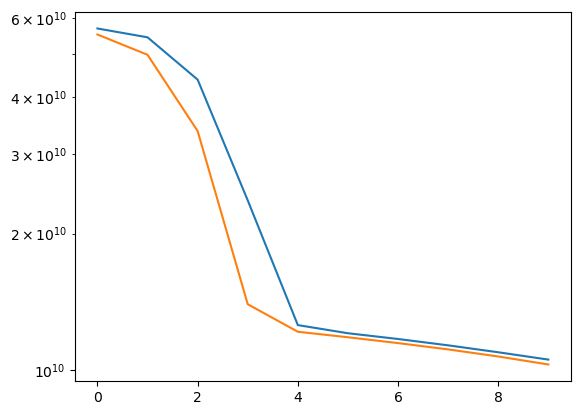

In [118]:
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.semilogy()
plt.show()

In [121]:
history1 = model.fit(attributes_train, target_train, epochs = 30, validation_data = (attributes_val, target_val))

Epoch 1/30
313/313 [==============================] - 2s 7ms/step - loss: 10079043584.0000 - val_loss: 9842219008.0000
Epoch 2/30
313/313 [==============================] - 2s 6ms/step - loss: 9597190144.0000 - val_loss: 9295834112.0000
Epoch 3/30
313/313 [==============================] - 2s 6ms/step - loss: 9061989376.0000 - val_loss: 8750660608.0000
Epoch 4/30
313/313 [==============================] - 2s 6ms/step - loss: 8497903104.0000 - val_loss: 8191019008.0000
Epoch 5/30
313/313 [==============================] - 2s 6ms/step - loss: 7925934080.0000 - val_loss: 7598435328.0000
Epoch 6/30
313/313 [==============================] - 2s 6ms/step - loss: 7378975232.0000 - val_loss: 7049355264.0000
Epoch 7/30
313/313 [==============================] - 2s 6ms/step - loss: 6869844992.0000 - val_loss: 6562668544.0000
Epoch 8/30
313/313 [==============================] - 2s 6ms/step - loss: 6459019264.0000 - val_loss: 6195782144.0000
Epoch 9/30
313/313 [==============================] - 2

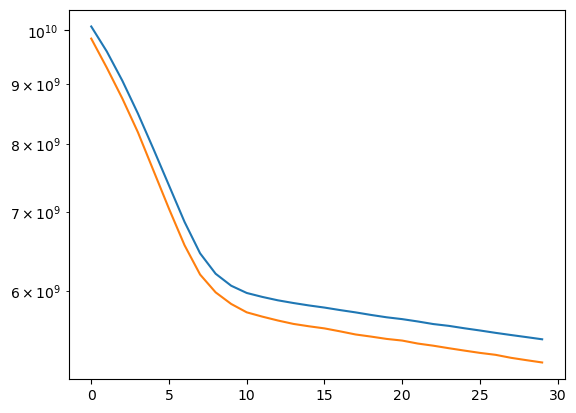

In [122]:
plt.plot(history1.history["loss"])
plt.plot(history1.history["val_loss"])
plt.semilogy()
plt.show()

In [128]:
history1 = model.fit(attributes_train, target_train, epochs = 100, validation_data = (attributes_val, target_val))

Epoch 1/100
313/313 [==============================] - 2s 6ms/step - loss: 4093870592.0000 - val_loss: 3923900416.0000
Epoch 2/100
313/313 [==============================] - 2s 5ms/step - loss: 4095250944.0000 - val_loss: 3925175808.0000
Epoch 3/100
313/313 [==============================] - 2s 6ms/step - loss: 4090971136.0000 - val_loss: 3934182656.0000
Epoch 4/100
313/313 [==============================] - 2s 6ms/step - loss: 4087569152.0000 - val_loss: 3931584256.0000
Epoch 5/100
313/313 [==============================] - 2s 7ms/step - loss: 4090277632.0000 - val_loss: 3945712384.0000
Epoch 6/100
313/313 [==============================] - 2s 6ms/step - loss: 4087485952.0000 - val_loss: 3935313152.0000
Epoch 7/100
313/313 [==============================] - 2s 5ms/step - loss: 4081387008.0000 - val_loss: 3924823296.0000
Epoch 8/100
313/313 [==============================] - 2s 6ms/step - loss: 4083586048.0000 - val_loss: 3918979072.0000
Epoch 9/100
313/313 [===========================

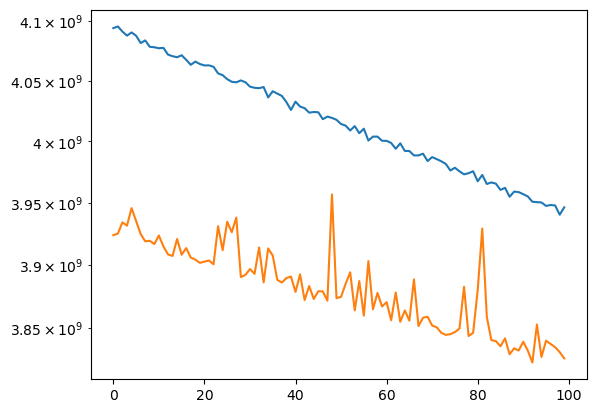

In [129]:
plt.plot(history1.history["loss"])
plt.plot(history1.history["val_loss"])
plt.semilogy()
plt.show()

We have 3 regularizations available for NN:
1. Kernel - for the weights
   ```
   kernel_regularizer = tf.keras.regularizers.L1L2(l1 = 0.005, l2 = 0.5) in the Dense layer we want to regularize
   ```
3. Bias - for the bias term
   ```
   bias_regularizer = ...
   ```
5. Activity - for the result after the activation function
   ```
   activity_regularizer = ...
   ```
We usually use kernel

How do we want to solve overfitting?
- less data
- weaker model
- more regularization

## Dropout

But in NN there is a better way to add regularization!

It is called [**Dropout**](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Dropout)

We use it ONLY! during the **TRAINING** period!

With **EACH** step we choose a rate of neurons that will be deactivated for this particular step only and train the NN like that.
Next step we choose at random another set of neurons to deactivate and so on. This simplifies the model and regularizes it.

Dropout does allow the NN to have connections that are too strong. In a way it forces the loss function to optimize for the weights to be smaller just like in ML regularization. Because sometimes that strong neuron connection will be deactivated and it will look for other ways to optimize the loss function.

The dropout rate is usually between [0.1, 0.5]

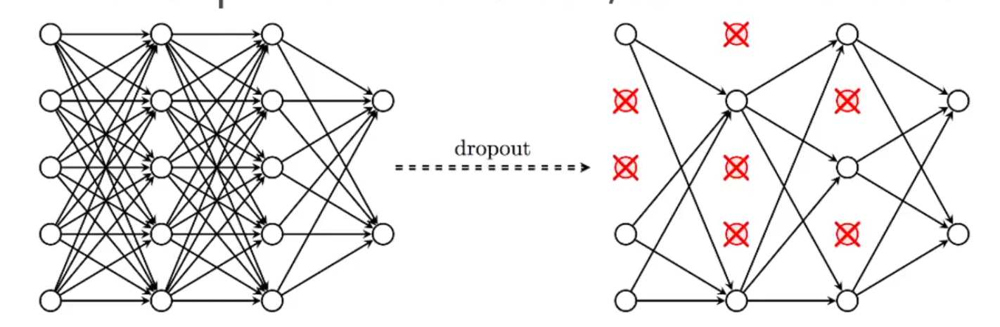

In [132]:
tf.keras.backend.clear_session()

DDROPOUT_RATE = 0.5

model_regularized = Sequential([
    Input(num_columns),
    Dense(32, activation = "relu"),
    Dropout(DDROPOUT_RATE),
    Dense(64, activation = "relu"),
    Dropout(DDROPOUT_RATE),
    Dense(32, activation = "relu"),
    Dense(num_outputs, activation = None)
])

model_regularized.compile(loss = "mse")
history = model_regularized.fit(attributes_train, target_train, epochs = 10, validation_data = (attributes_val, target_val))

Epoch 1/10
313/313 [==============================] - 3s 6ms/step - loss: 56760467456.0000 - val_loss: 54907494400.0000
Epoch 2/10
313/313 [==============================] - 2s 6ms/step - loss: 53314682880.0000 - val_loss: 47347818496.0000
Epoch 3/10
313/313 [==============================] - 2s 7ms/step - loss: 38989934592.0000 - val_loss: 26359900160.0000
Epoch 4/10
313/313 [==============================] - 2s 7ms/step - loss: 18487205888.0000 - val_loss: 12448217088.0000
Epoch 5/10
313/313 [==============================] - 2s 7ms/step - loss: 14444777472.0000 - val_loss: 12083992576.0000
Epoch 6/10
313/313 [==============================] - 2s 6ms/step - loss: 14092075008.0000 - val_loss: 11711670272.0000
Epoch 7/10
313/313 [==============================] - 2s 7ms/step - loss: 14055635968.0000 - val_loss: 11446634496.0000
Epoch 8/10
313/313 [==============================] - 2s 7ms/step - loss: 13687255040.0000 - val_loss: 11198627840.0000
Epoch 9/10
313/313 [====================

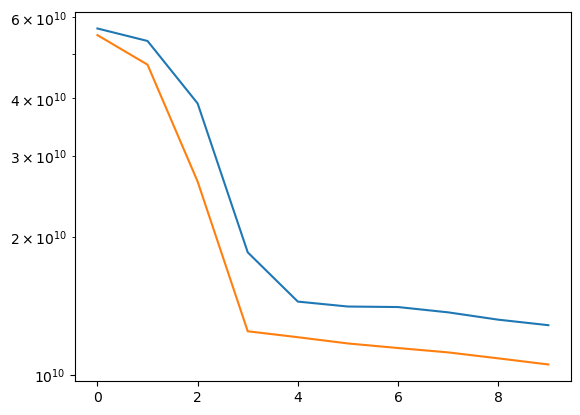

In [133]:
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.semilogy()
plt.show()

In [134]:
model_regularized.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                288       
                                                                 
 dropout (Dropout)           (None, 32)                0         
                                                                 
 dense_1 (Dense)             (None, 64)                2112      
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_2 (Dense)             (None, 32)                2080      
                                                                 
 dense_3 (Dense)             (None, 1)                 33        
                                                                 
Total params: 4513 (17.63 KB)
Trainable params: 4513 (17

Putting a Dropout layer directly after the Input layer acts as feature selection. It will remove some of the input neurons at steps. It is a little weird we dont use it.

We dont use GridSearch on NN. It is a bit of a trial and error process. We train a model we see the result and then we tweak a hyperparameter or change the architecture.

## Selecting and Splitting Data

The idea is to have the most amount of data for TRAINING!

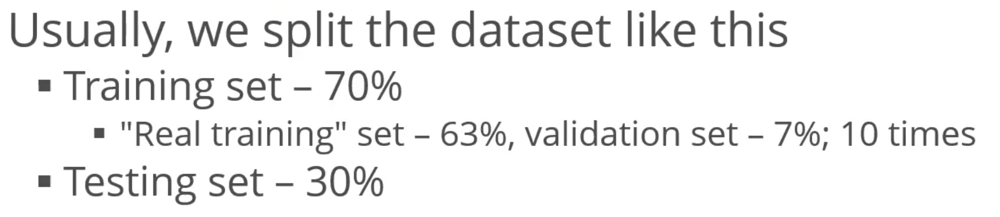

## Bias-Variance Error Anlysis

Bayes optimal error (BOE) (Intrinsic error/variation)- measure of what the best theoretical algorithm can do with the data. The best that is possible.

Bias - differnece between the Bayes optimal error and what we get from the training data

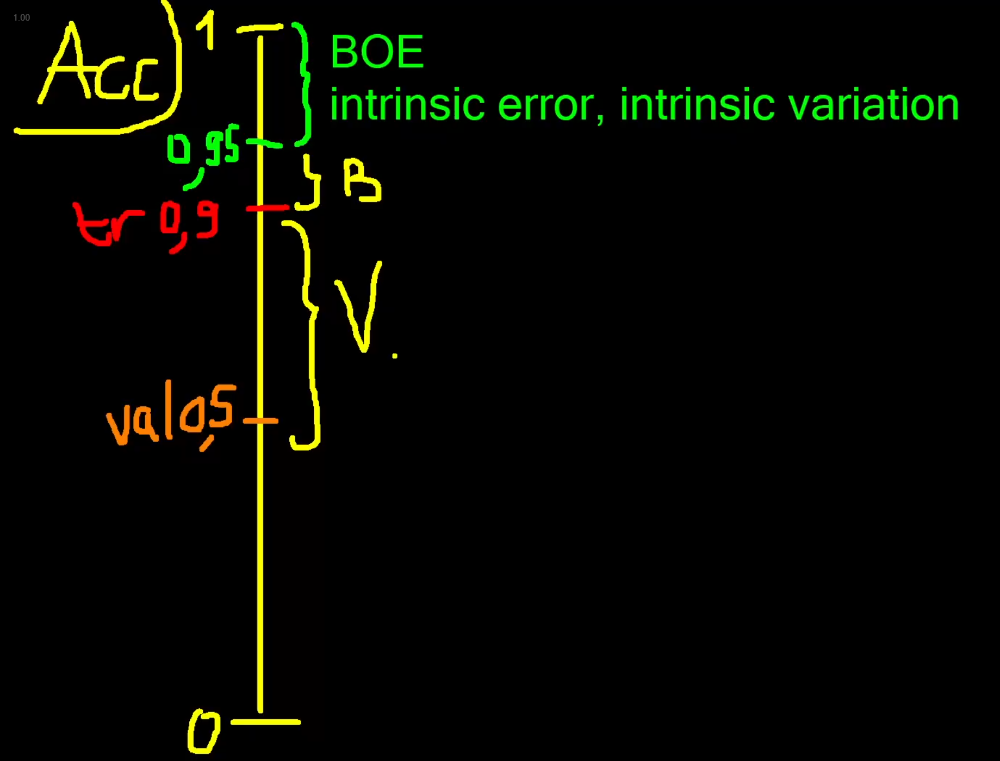

The image shows there isn't a tradeoff between bias and variance. They are both present.

The only way to know the BOS or the green number in the picture is to know the data. That is the only way.

The difference between the green (BOS) and red(training acc) number is what is possible to learn and what it has learned.

The difference between the red(training acc) and orange(validation acc) number is what the model has seen and not seen. The ability to generalize well.

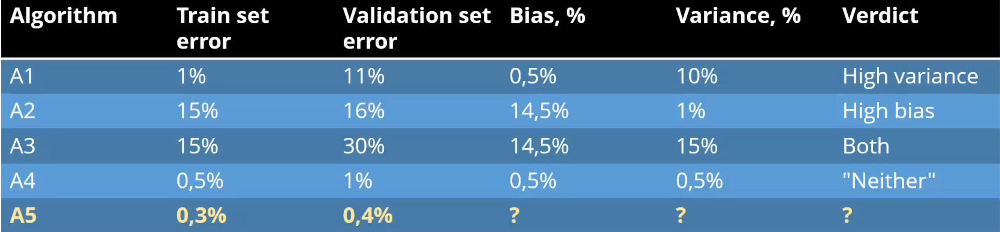

[Neural architecture search](https://en.wikipedia.org/wiki/Neural_architecture_search) - Use a NN to search and opimize the architecture of another NN

[Genetic Algorithms](https://www.mathworks.com/help/gads/what-is-the-genetic-algorithm.html) - The genetic algorithm is a method for solving both constrained and unconstrained optimization problems that is based on natural selection, the process that drives biological evolution. The genetic algorithm repeatedly modifies a population of individual solutions. At each step, the genetic algorithm selects individuals from the current population to be parents and uses them to produce the children for the next generation. Over successive generations, the population "evolves" toward an optimal solution

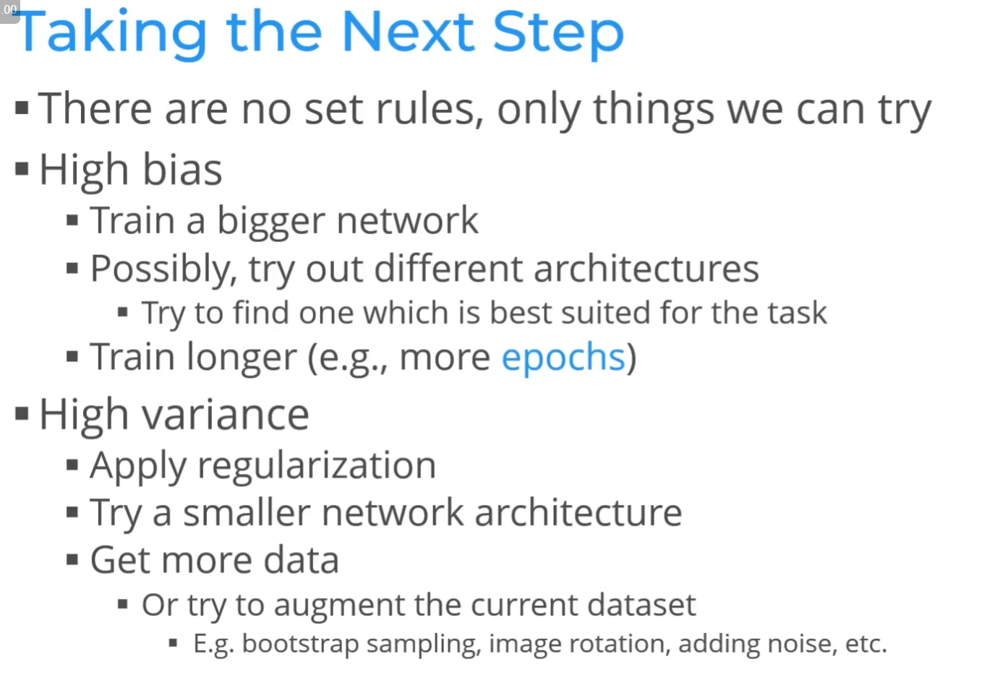

[Mixture of experts (MoE)](https://en.wikipedia.org/wiki/Mixture_of_experts#:~:text=Mixture%20of%20experts%20(MoE)%20is,problem%20space%20into%20homogeneous%20regions.) - 
a machine learning technique where multiple expert networks (learners) are used to divide a problem space into homogeneous regions.[1] It differs from ensemble techniques in that typically only one or a few expert models will be run, rather than combining results from all models.

Similar to ADA Boost

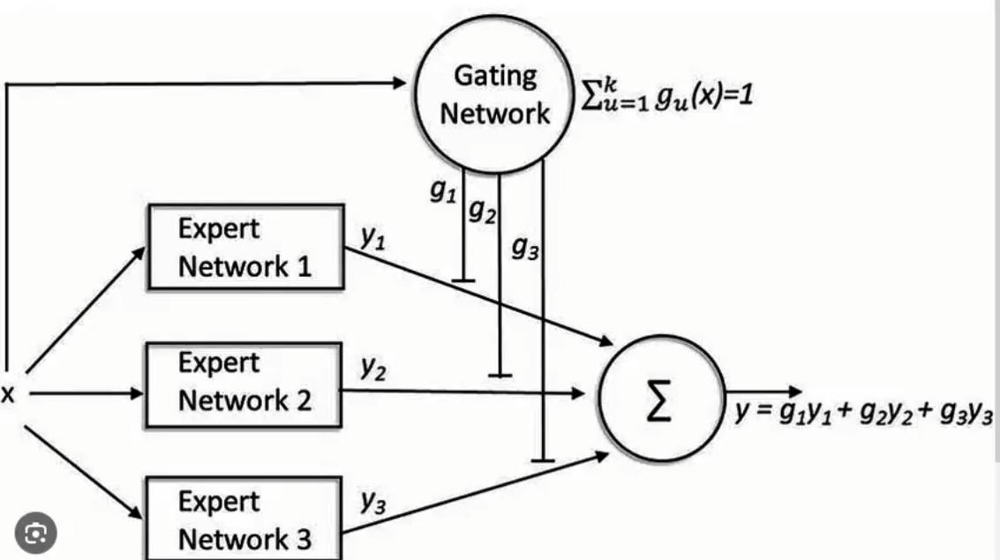

### How do we know when to stop training the model?

[Early stopping](https://machinelearningmastery.com/early-stopping-to-avoid-overtraining-neural-network-models/) is a form of regularization that stops the training process of a neural network before it reaches the maximum number of epochs or iterations. The idea is to monitor the performance of the network on a validation set, and stop the training when the validation error starts to increase or stops improving.


In [2]:
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
tf.keras.backend.clear_session()

DDROPOUT_RATE = 0.5

model_early_stopping = Sequential([
    Input(num_columns),
    Dense(32, activation = "relu"),
    Dropout(DDROPOUT_RATE),
    Dense(64, activation = "relu"),
    Dropout(DDROPOUT_RATE),
    Dense(32, activation = "relu"),
    Dense(num_outputs, activation = None)
])

model_early_stopping.compile(loss = "mse")
history = model_early_stopping.fit(attributes_train, target_train, epochs = 10, validation_data = (attributes_val, target_val), callbacks=[EarlyStopping(patience=3, min_delta=0.1)])

If the delta between 2 consecutive epochs is less than the DELTA (hyperparameter in EarlyStopping() constructor) for PATIENCE (hyperparameter in EarlyStopping() constructor) amout of epochs then we stop the training

Example:

min_delta = 0.1

patience = 3

Deltas history: 0.4, 0.3, 0.1, 0.1, **0.1**, ...

It will stop at the bolded delta since it is the 3rd that is below 0.1 (not sure if it is < or <= but w/e, you get the point)

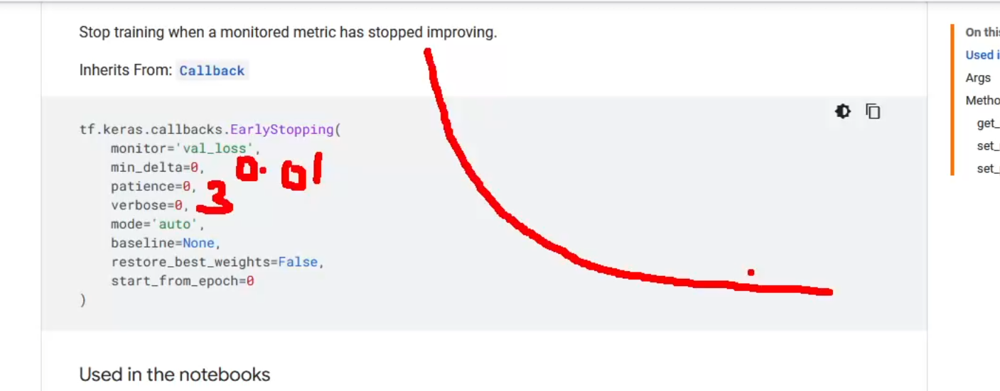

Could be troublesome technique since sometimes the loss functions look like this:

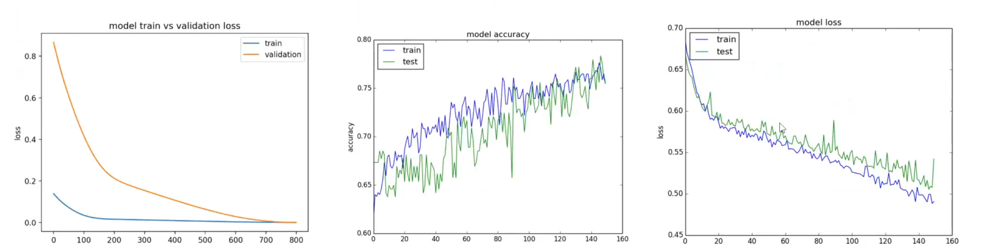

## Weight initialization

It is very inportant that the weights are initialized properly. If they are too small or big it can be problematic.( Vanishing/Exploading gradients )

Scaled data => weighted coeff show feature importances.

If a weight is too big it means it is either very important or it is just working with big numbers


#### [Glorot(Xavier) Initialization](https://365datascience.com/tutorials/machine-learning-tutorials/what-is-xavier-initialization/)

The main idea is to set the initial weights of the network in a way that allows the activations and gradients to flow effectively during both forward and backpropagation. It considers the number of input and output units of each layer to determine the scale of the random initialization.

If we have a lot of inputs it is important that the weights are close to one another in terms of values.
So we initialzie them as: 

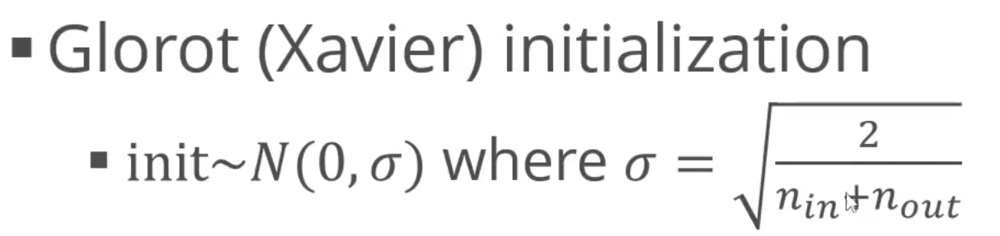

This means the more points we have the smaller the StdDiv which means we will initialize them closer since it is N(0,sigma)

## Mini-batch GD

When we dont know what batch to choose, we choose powers of 2 => 16, 32, 64 etc.

Make sure you can fit the whole model and atleast 1 batch of the data in the GPU RAM if you are training on GPU ofc

If we have less memory on the GPU we will use a smaller batch size. 

When we use a smaller batch size the loss function is more 
spiky.

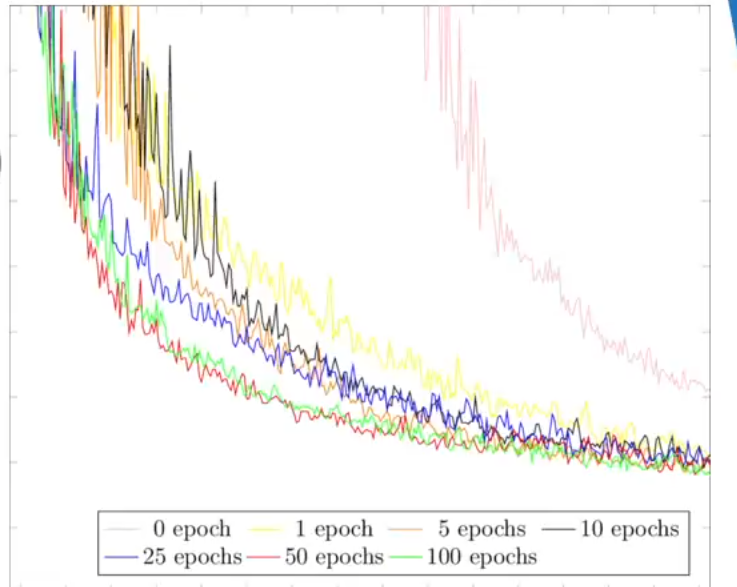

Bigger batch sizes take longer to train 

## Choosing a good learning rate

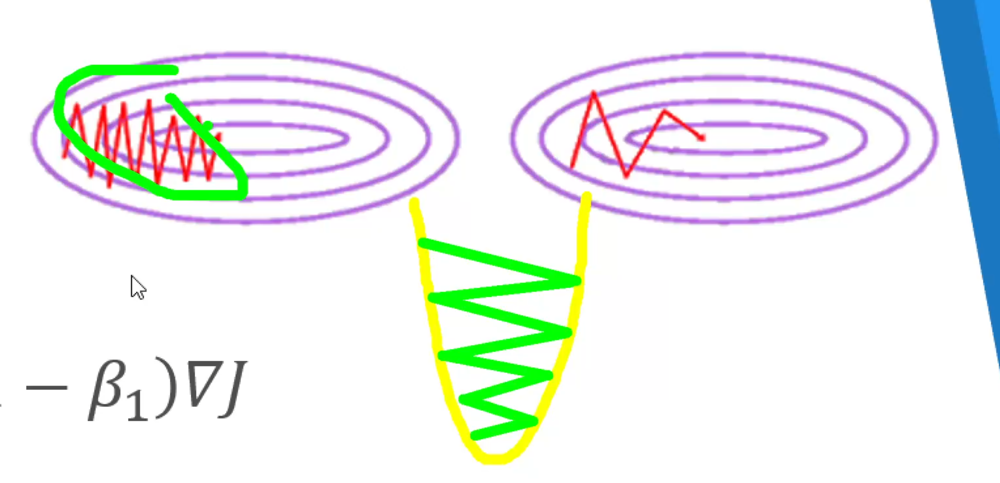

EWMA is used as Momentum. Make the loss function move in the more "valuable" direction. Use the average of the previous steps to tweak the current step.

[RMSprop](https://optimization.cbe.cornell.edu/index.php?title=RMSProp#:~:text=RMSProp%2C%20root%20mean%20squared%20propagation,of%20gradients%20descent%20and%20RProp.) - root mean squared propagation is the optimization machine learning algorithm to train the Artificial Neural Network (ANN) by different adaptive learning rate and derived from the concepts of gradients descent and RProp.

## Adam Optimizer (Adaptive Moment Estimation)

Almost always used!

Combines Momentum and RMSprop

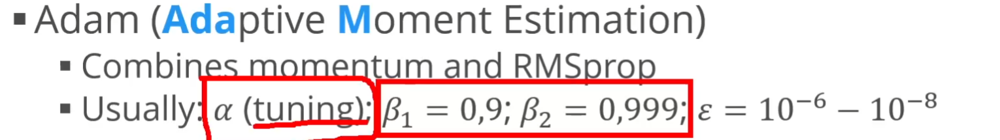

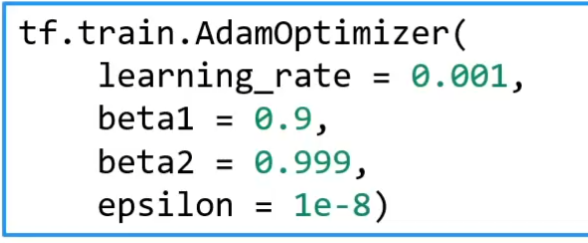

Basically when we get closer to the minimum we tweak the step to be smaller and in a better direction.

Recently people started using this:

[Cosine Learning rate](https://serp.ai/cosine-annealing/) - The term "cosine" in Cosine Annealing refers to the way that the learning rate is adjusted over the course of each cycle. The learning rate schedule follows a cosine curve, starting at a maximum value and decaying to a minimum value, before ramping back up again.

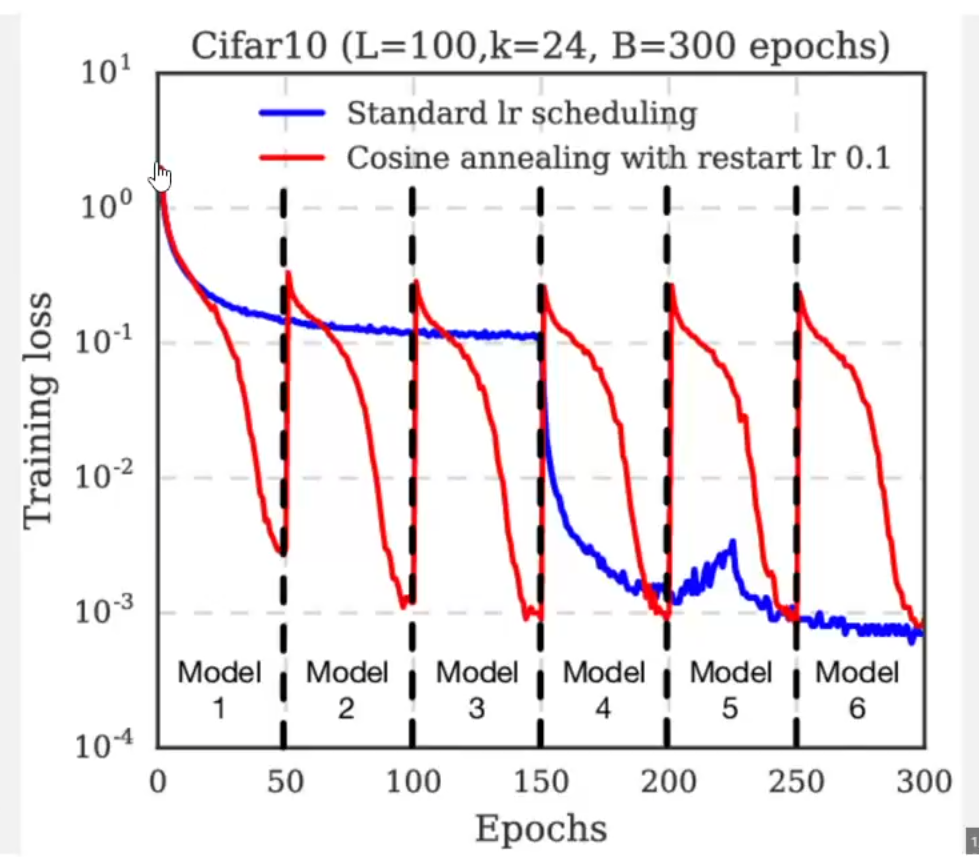
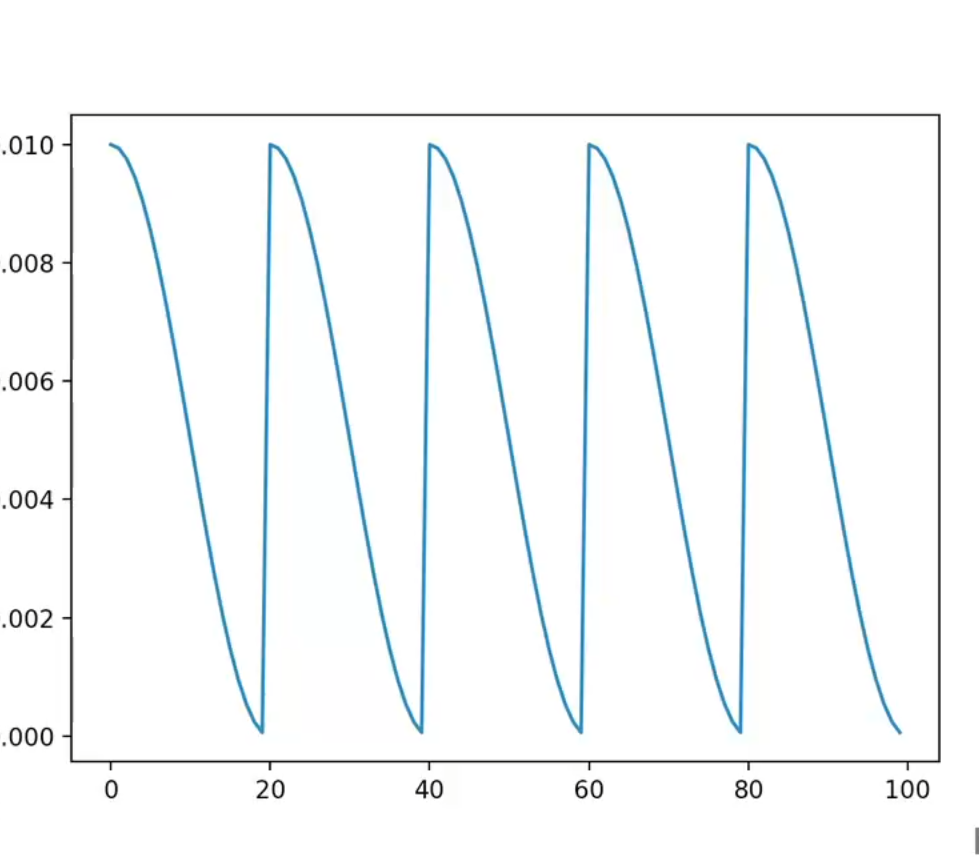

If we are in a local min as such:

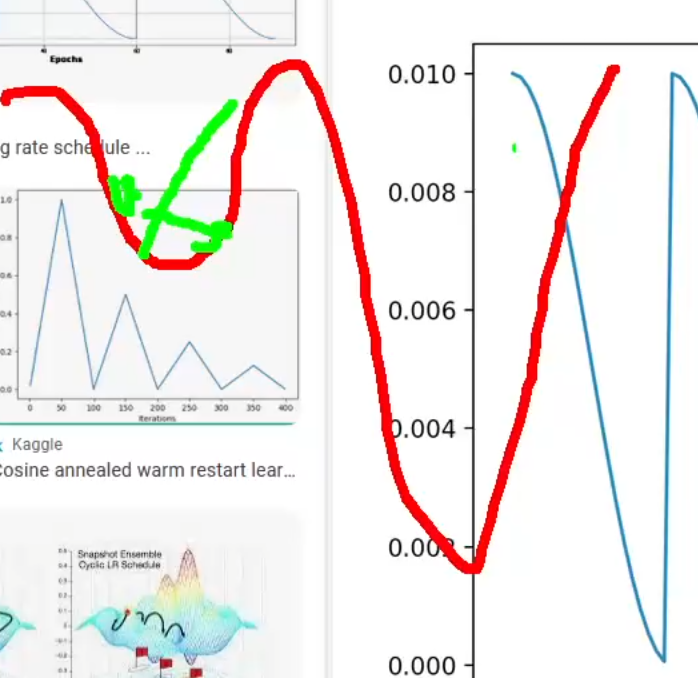

A spike resulting in a big learning rate can help us get out of it

Local mins are often saddle (pringle) points

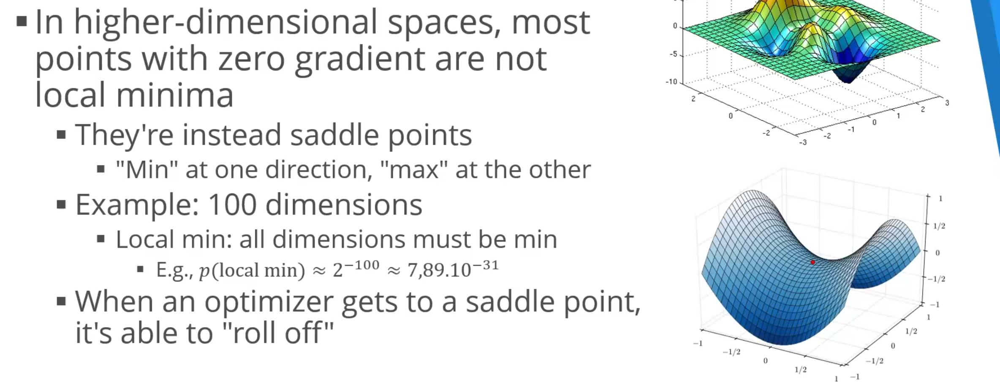


The best thing to tune as a hyperparam is the learning rate. Adam is always used.

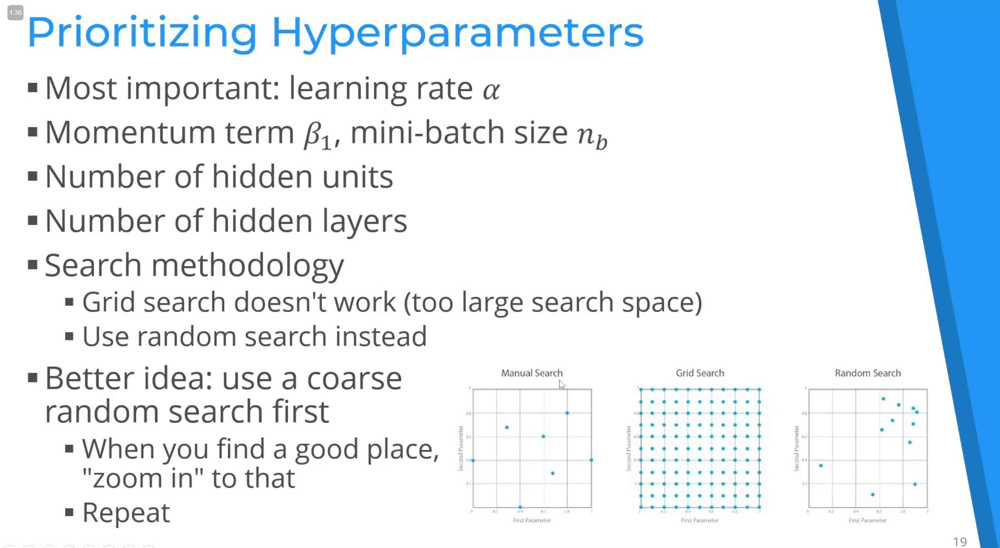

Grid search is too slow. Manual or Random search are better. Mostly Manual. So think!

## Batch Normalization

What happens if the gradients explode or vanish midway?

Batch Normalization - does a StandardScaler or Z-score normalization (making something to a normal distribution) between 2 layers

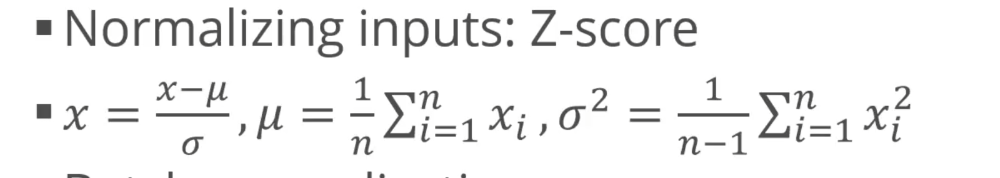

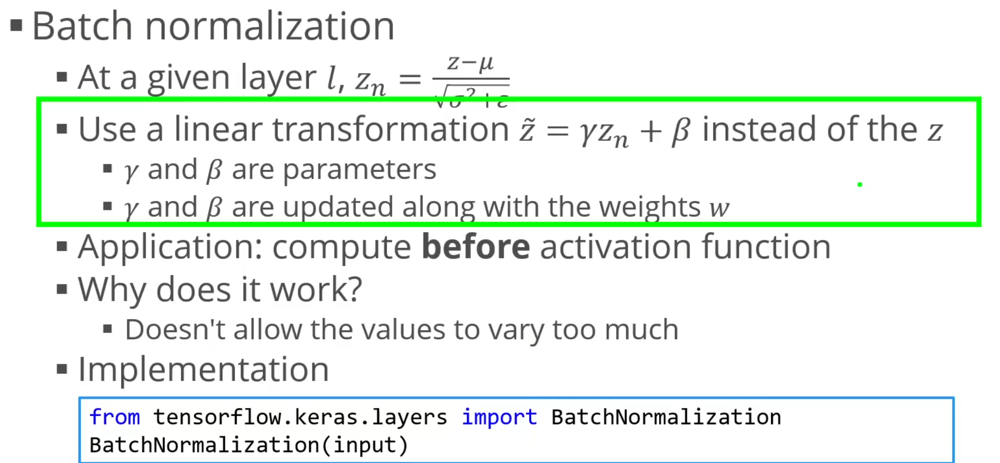

We do this midway before the activation function. This deals with exploading or vanishing **ACTIVATIONS** not weights!